In [1]:
## NLTK SET UP ##

## Natural language processing, pandas setup

#Import tokenization, download stopwords & punkt. Download not needed each run but left in for compatibility.
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk import download 
import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('wordnet')


## Feed variable with NLTK stopwords
stop_words = set(stopwords.words("swedish"))

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/bohmaniac/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/bohmaniac/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/bohmaniac/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [74]:
## SET UP PANDAS & READ FILE ##
import pandas as pd
# read the file called 2022.json that is in the same directory and call it jobtech_dataset
#jobtech_dataset = pd.read_csv('jobtech_dataset2022.csv')
jobtech_dataset = pd.read_csv('dfsvenska.csv')
#pd.set_option('max_colwidth', None) # Tell editor to not limit column width


df = jobtech_dataset[['description', 'occupation']]  # Picking our columns

# create an empty list to store cleaned occupations
cleaned_occupations = []

# loop through every row in the dataset
for index, row in df.iterrows():
    
    # get the occupation column value and clean out the first 41 characters
    occupation = row['occupation'][41:]
    
    # split the occupation string by whitespace and keep only the first word
    cleaned_occupation = occupation.split()[0]
    
    # add the cleaned occupation to the list
    cleaned_occupations.append(cleaned_occupation)

# create a new dataframe with the cleaned occupations
new_df = pd.DataFrame({'cleaned_occupation': cleaned_occupations})
df = new_df
# print the new dataframe
print(df)

                        cleaned_occupation
0                           Projektledare,
1                   Databasadministratör',
2                    Journalist/Reporter',
3                    Handläggare/Utredare,
4                           Projektledare,
...                                    ...
9915  Behandlingsassistent/Socialpedagog',
9916               Kundtjänstmedarbetare',
9917           CNC-operatör/FMS-operatör',
9918           CNC-operatör/FMS-operatör',
9919                           Barnmorska,

[9920 rows x 1 columns]


In [75]:
##Ta ut de viktigaste 

# create an empty dictionary to store occupation descriptions
occupation_descriptions = {}

# loop through each occupation in the cleaned occupation column
for occupation in df['occupation'].unique():
    
    # filter the descriptions for this occupation
    occupation_desc = list(df[df['cleaned_occupation'] == occupation]['cleaned_description'])
    
    # add the list of descriptions to the dictionary
    occupation_descriptions[occupation] = occupation_desc

KeyError: 'occupation'

In [76]:
import pandas as pd

# read the file and select the relevant columns
jobtech_dataset = pd.read_csv('dfsvenska.csv')
df = jobtech_dataset[['description', 'occupation']]

# clean the occupation column and create a new column for the cleaned occupation
cleaned_occupations = []
for index, row in df.iterrows():
    occupation = row['occupation'][41:]
    cleaned_occupation = occupation.split()[0]
    cleaned_occupations.append(cleaned_occupation)
df['cleaned_occupation'] = cleaned_occupations

# loop through each unique occupation and find the corresponding description(s)
occupations = df['cleaned_occupation'].unique()
occupation_descriptions = []
for occupation in occupations:
    description = ""
    for index, row in df.iterrows():
        if row['cleaned_occupation'] == occupation:
            description += row['description'] + " "
    occupation_descriptions.append(description.strip())

# create a new dataframe with the occupations and descriptions
new_df = pd.DataFrame({'occupation': occupations, 'description': occupation_descriptions})

# print the new dataframe
print(new_df)

/var/folders/zr/mz6c_4k94t907vnlkq6817h80000gn/T/ipykernel_3807/225973333.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cleaned_occupation'] = cleaned_occupations


                 occupation                                        description
0            Projektledare,  {'text': 'Tänk dig de mest högteknologiska ele...
1    Databasadministratör',  {'text': 'I denna projektanställning på deltid...
2     Journalist/Reporter',  {'text': 'Deltidsskribenter med stort nyhets- ...
3     Handläggare/Utredare,  {'text': 'Är du social och vet vad god service...
4         Transportledare',  {'text': 'Vill du arbeta med framtidens skogst...
..                      ...                                                ...
882      Trafiksamordnare',  {'text': 'Göteborg är mitt uppe i ett stort st...
883         Svetsingenjör',  {'text': 'För kunds räkning söker vi en Svetsa...
884           Komminister',  {'text': 'Beskrivning\nVi söker dig som vill h...
885              Inspektör,  {'text': 'Är du redo för en större uppgift?\nA...
886    Förvaltningsekonom',  {'text': 'Du blir en del av ett team med tätt ...

[887 rows x 2 columns]


In [ ]:
import matplotlib.pyplot as plt
from nltk.probability import FreqDist

# create a list to store the word frequencies for each occupation
word_freqs = []

# loop through every occupation in the dataset
for occupation in occupations:
    
    # get the descriptions for the occupation
    descriptions = df[df['occupation'] == occupation]['description'].tolist()
    
    # combine all the descriptions into a single string
    text = ' '.join(descriptions)
    
    # tokenize the text
    tokens = nltk.word_tokenize(text)
    
    # create a frequency distribution of the tokens
    freq_dist = FreqDist(tokens)
    
    # add the word frequencies to the list
    word_freqs.append((occupation, freq_dist))
    
# loop through the word frequencies and plot a graph for each occupation
for occupation, freq_dist in word_freqs:
    plt.figure(figsize=(16,5))
    plt.title(occupation)
    freq_dist.plot(50)
    plt.show()


In [ ]:
##Kanske funkar

import pandas as pd
import matplotlib.pyplot as plt
from nltk.probability import FreqDist
import nltk

# read the file and select the relevant columns
jobtech_dataset = pd.read_csv('dfsvenska.csv')
df = jobtech_dataset[['description', 'occupation']]

# clean the occupation column and create a new column for the cleaned occupation
cleaned_occupations = []
for index, row in df.iterrows():
    occupation = row['occupation'][41:]
    cleaned_occupation = occupation.split()[0]
    cleaned_occupations.append(cleaned_occupation)
df['cleaned_occupation'] = cleaned_occupations

# loop through each unique occupation and find the corresponding description(s)
occupations = df['cleaned_occupation'].unique()
occupation_descriptions = []
for occupation in occupations:
    description = ""
    for index, row in df.iterrows():
        if row['occupation'] == occupation:
            description += row['description'] + " "
    occupation_descriptions.append(description.strip())

# create a new dataframe with the occupations and descriptions
new_df = pd.DataFrame({'occupation': occupations, 'description': occupation_descriptions})

# print the new dataframe
print(new_df)

# create a list to store the word frequencies for each occupation
word_freqs = []

# loop through every occupation in the dataset
for occupation in occupations:
    
    # get the descriptions for the occupation
    descriptions = new_df[new_df['occupation'] == occupation]['description'].tolist()
    
    # combine all the descriptions into a single string
    text = ' '.join(descriptions)
    
    # tokenize the text
    tokens = nltk.word_tokenize(text)
    
    # create a frequency distribution of the tokens
    freq_dist = FreqDist(tokens)
    
    # add the word frequencies to the list
    word_freqs.append((occupation, freq_dist))
    
# loop through the word frequencies and plot a graph for each occupation
for occupation, freq_dist in word_freqs:
    plt.figure(figsize=(16,5))
    plt.title(occupation)
    freq_dist.plot(50)
    plt.show()

In [ ]:
## Fungerar ändra ej

##Kanske funkar

import pandas as pd
import matplotlib.pyplot as plt
from nltk.probability import FreqDist
import nltk
from nltk.corpus import stopwords
swedish_stop_words = [
    'och', 'i', 'att', 'en', 'som', 'för', 'med', 'till', 'på', 'är',
    'av', 'om', 'den', 'de', 'vi', 'du', 'han', 'hon', 'det', 'så',
    'kan', 'men', 'hur', 'när', 'där', 'var', 'sig', 'ett', 'från',
    'ha', 'har', 'inte', 'eller', 'man', 'vid', 'blir', 'blev', 'gör',
    'gjort', 'gjorde', 'göra', 'ska', 'skall', 'samma', 'sådan', 'sådant',
    'sådana', 'din', 'ditt', 'mina', 'mitt', 'enligt', 'både', 'även',
    'första', 'genom', 'mellan', 'någon', 'något', 'några', 'sista',
    'under', 'utan', 'över', 'förra', 'fram', 'hela', 'närvarande',
    'sista', 'samma', 'samma', 'samma'
]
# read the file and select the relevant columns
jobtech_dataset = pd.read_csv('dfsvenska.csv')
df = jobtech_dataset[['description', 'occupation']]

# clean the occupation column and create a new column for the cleaned occupation
cleaned_occupations = []
for index, row in df.iterrows():
    occupation = row['occupation'][41:]
    cleaned_occupation = occupation.split()[0]
    cleaned_occupations.append(cleaned_occupation)
df['cleaned_occupation'] = cleaned_occupations

# loop through each unique occupation and find the corresponding description(s)
occupations = df['cleaned_occupation'].unique()
occupation_descriptions = []
for occupation in occupations:
    description = ""
    for index, row in df.iterrows():
        if row['cleaned_occupation'] == occupation:
            description += row['description'] + " "
    occupation_descriptions.append(description.strip())

# create a new dataframe with the occupations and descriptions
new_df = pd.DataFrame({'occupation': occupations, 'description': occupation_descriptions})

# print the new dataframe
print(new_df)

# create a list to store the word frequencies for each occupation
word_freqs = []

# loop through every occupation in the dataset
for occupation in occupations:
    
    # get the descriptions for the occupation
    descriptions = new_df[new_df['occupation'] == occupation]['description'].tolist()
    
    # combine all the descriptions into a single string
    text = ' '.join(descriptions)
    
    # tokenize the text
    tokens = nltk.word_tokenize(text)
    
    filtered_tokens = [word for word in tokens if word.lower() not in swedish_stop_words]


    # create a frequency distribution of the tokens
    freq_dist = FreqDist(tokens)
    
    # add the word frequencies to the list
    word_freqs.append((occupation, freq_dist))
    
# loop through the word frequencies and plot a graph for each occupation
for occupation, freq_dist in word_freqs:
    plt.figure(figsize=(16,5))
    plt.title(occupation)
    freq_dist.plot(50)
    plt.show()

In [ ]:
## Funkar inte

import pandas as pd
import matplotlib.pyplot as plt
from nltk.probability import FreqDist
from nltk.corpus import stopwords
import nltk

# load the stop words for Swedish
swedish_stopwords = stopwords.words('swedish')

# read the file and select the relevant columns
jobtech_dataset = pd.read_csv('dfsvenska.csv')
df = jobtech_dataset[['description', 'occupation']]

# clean the occupation column and create a new column for the cleaned occupation
cleaned_occupations = []
for index, row in df.iterrows():
    occupation = row['occupation'][41:]
    cleaned_occupation = occupation.split()[0]
    cleaned_occupations.append(cleaned_occupation)
df['cleaned_occupation'] = cleaned_occupations

# loop through each unique occupation and find the corresponding description(s)
occupations = df['cleaned_occupation'].unique()
occupation_descriptions = []
for occupation in occupations:
    description = ""
    for index, row in df.iterrows():
        if row['occupation'] == occupation:
            description += row['description'] + " "
    occupation_descriptions.append(description.strip())

# create a new dataframe with the occupations and descriptions
new_df = pd.DataFrame({'occupation': occupations, 'description': occupation_descriptions})

# create a list to store the word frequencies for each occupation
word_freqs = []

# loop through every occupation in the dataset
for occupation in occupations:
    
    # get the descriptions for the occupation
    descriptions = new_df[new_df['occupation'] == occupation]['description'].tolist()
    
    # combine all the descriptions into a single string
    text = ' '.join(descriptions)
    
    # tokenize the text and remove stop words
    tokens = [token.lower() for token in nltk.word_tokenize(text) if token.lower() not in swedish_stopwords]
    
    # create a frequency distribution of the tokens
    freq_dist = FreqDist(tokens)
    
    # add the word frequencies to the list
    word_freqs.append((occupation, freq_dist))
    
# loop through the word frequencies and plot a graph for each occupation
for occupation, freq_dist in word_freqs:
    plt.figure(figsize=(16,5))
    plt.title(occupation)
    freq_dist.plot(50)
    plt.show()

/var/folders/zr/mz6c_4k94t907vnlkq6817h80000gn/T/ipykernel_3807/3847403468.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cleaned_occupation'] = cleaned_occupations


                 occupation                                        description
0            Projektledare,  'text 'Tänk dig mest högteknologiska elektroni...
1    Databasadministratör',  'text denna projektanställning deltid sammanst...
2     Journalist/Reporter',  'text 'Deltidsskribenter stort nyhets- samhäll...
3     Handläggare/Utredare,  'text 'Är social vet vad god service innebär T...
4         Transportledare',  'text 'Vill arbeta framtidens skogstransporter...
..                      ...                                                ...
882      Trafiksamordnare',  'text 'Göteborg uppe stort stadsutvecklingsspr...
883         Svetsingenjör',  'text 'För kunds räkning söker Svetsansvarig\n...
884           Komminister',  'text 'Beskrivning\nVi söker dig vill prästtjä...
885              Inspektör,  'text 'Är redo större uppgift \nAtt arbeta Pol...
886    Förvaltningsekonom',  'text 'Du del team tätt samarbete stort förtro...

[887 rows x 2 columns]


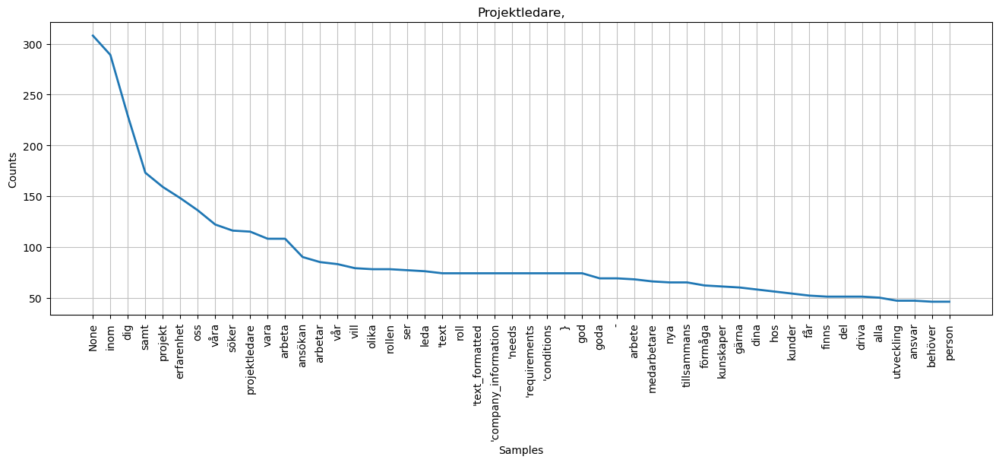

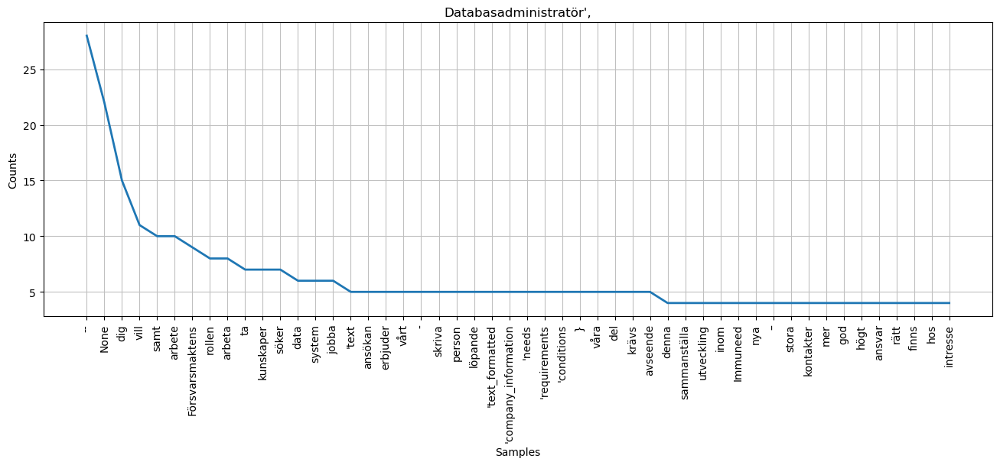

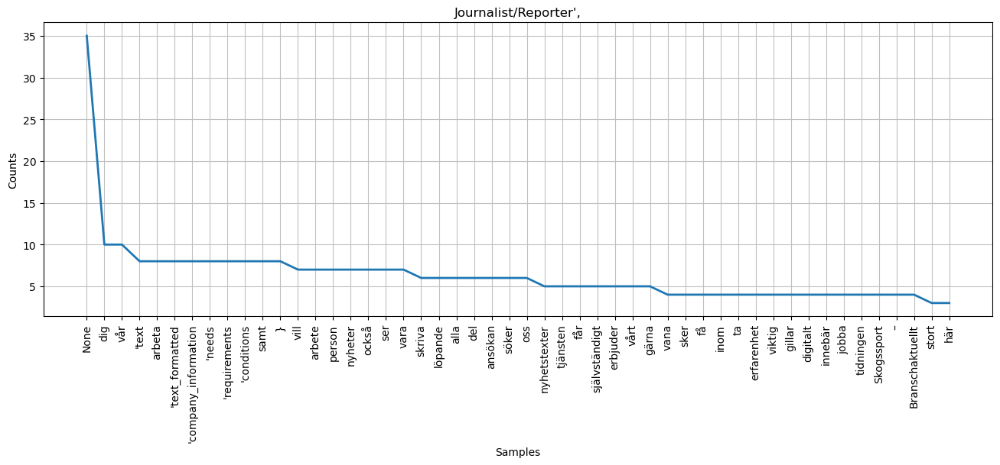

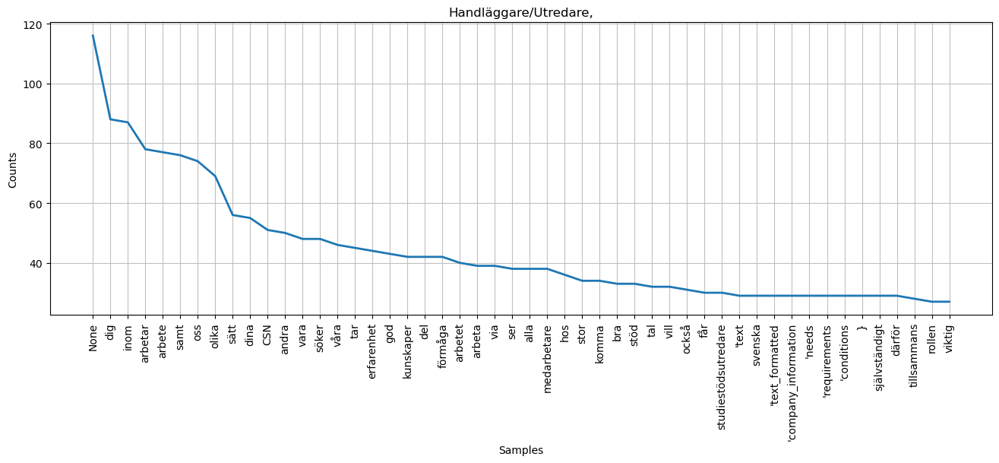

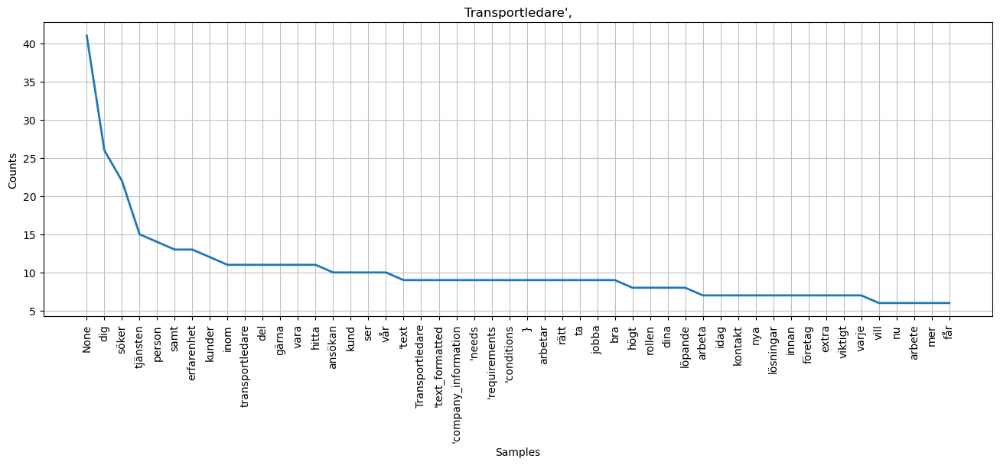

...

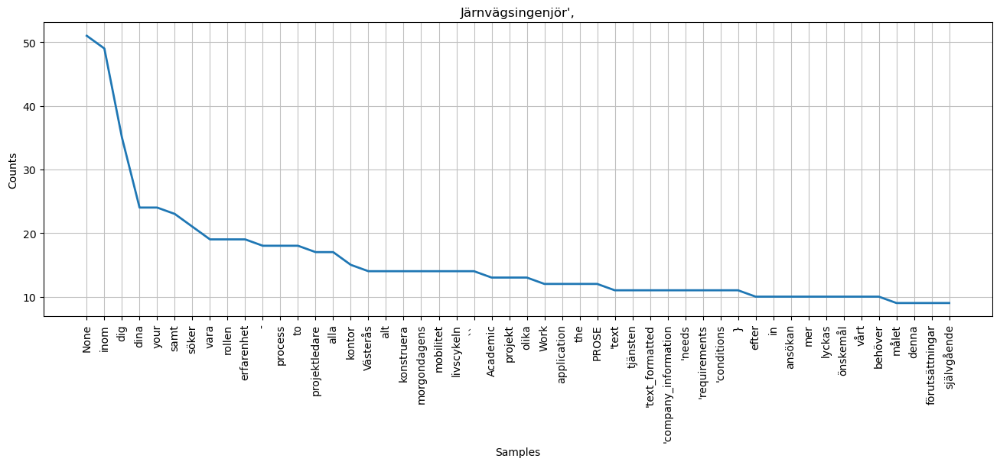

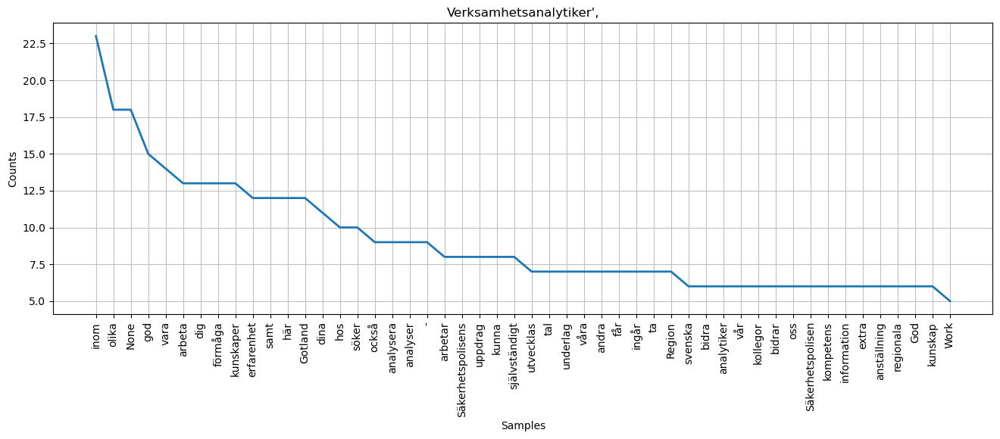

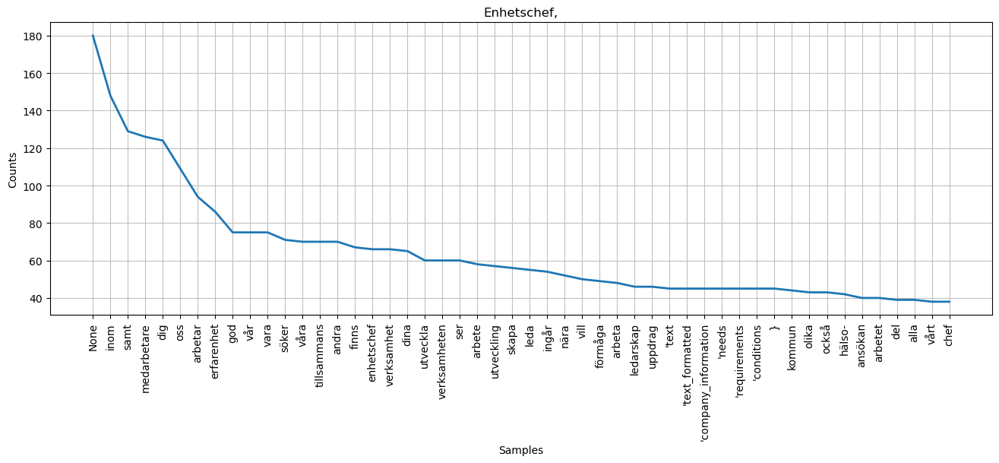

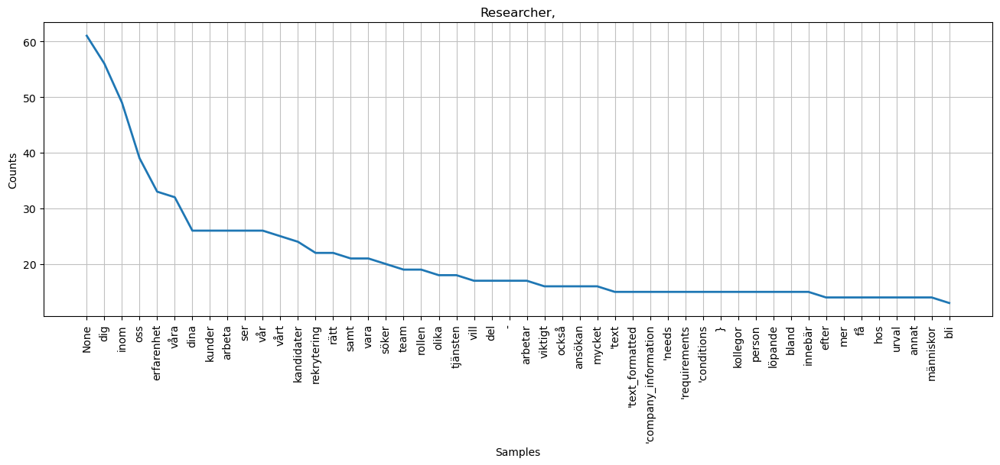

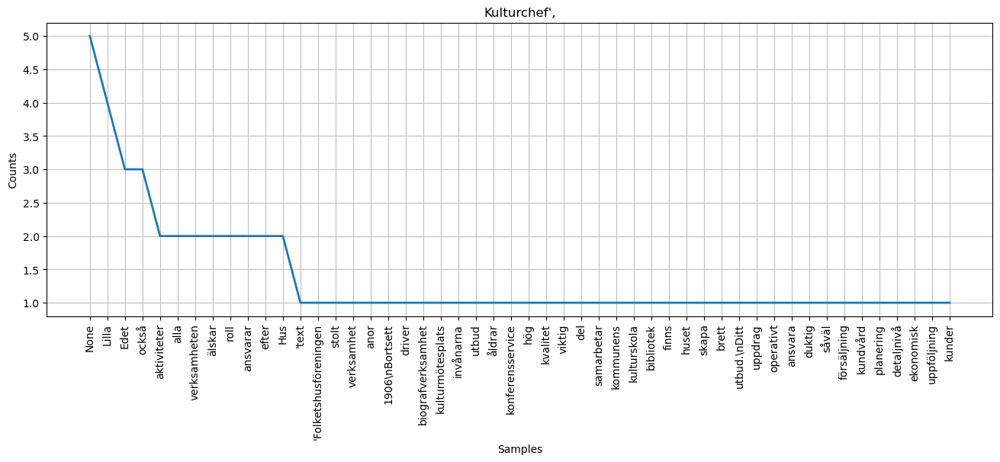

KeyboardInterrupt: 

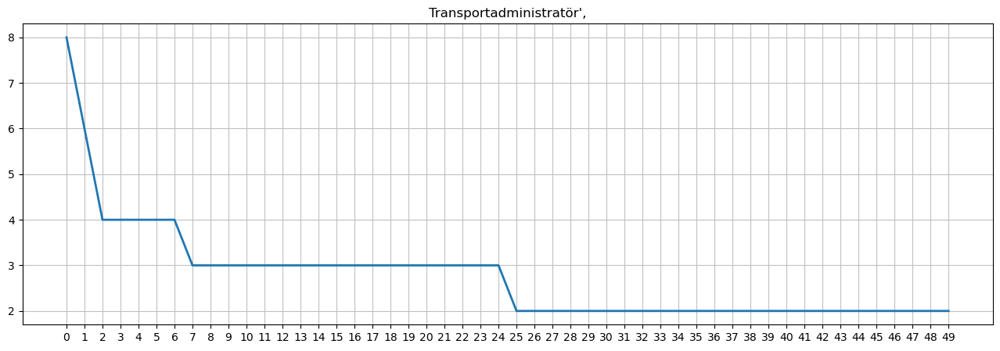

In [92]:
#DEn ännu bättre

## Kanske också fungerar

##Kanske funkar

import pandas as pd
import matplotlib.pyplot as plt
from nltk.probability import FreqDist
import nltk
from nltk.corpus import stopwords
swedish_stop_words = [
    'och', 'i', 'att', 'en', 'som', 'för', 'med', 'till', 'på', 'är',
    'av', 'om', 'den', 'de', 'vi', 'du', 'han', 'hon', 'det', 'så',
    'kan', 'men', 'hur', 'när', 'där', 'var', 'sig', 'ett', 'från',
    'ha', 'har', 'inte', 'eller', 'man', 'vid', 'blir', 'blev', 'gör',
    'gjort', 'gjorde', 'göra', 'ska', 'skall', 'samma', 'sådan', 'sådant',
    'sådana', 'din', 'ditt', 'mina', 'mitt', 'enligt', 'både', 'även',
    'första', 'genom', 'mellan', 'någon', 'något', 'några', 'sista',
    'under', 'utan', 'över', 'förra', 'fram', 'hela', 'närvarande',
    'sista', 'samma', 'samma', 'samma', "'", ',', '.', 'text', "'", ".", ":", "!", "*", "None", ",", "(", ")", "?", "{", "kommer"
]
# read the file and select the relevant columns
jobtech_dataset = pd.read_csv('dfsvenska.csv')
df = jobtech_dataset[['description', 'occupation']]

# assuming your dataframe is called "df" and the description column is called "description"
for i in range(len(df)):
    text = df.loc[i, 'description']
    words = nltk.word_tokenize(text)
    filtered_words = [word for word in words if word.lower() not in swedish_stop_words]
    df.at[i, 'description'] = ' '.join(filtered_words)

# clean the occupation column and create a new column for the cleaned occupation
cleaned_occupations = []
for index, row in df.iterrows():
    occupation = row['occupation'][41:]
    cleaned_occupation = occupation.split()[0]
    cleaned_occupations.append(cleaned_occupation)
df['cleaned_occupation'] = cleaned_occupations

# loop through each unique occupation and find the corresponding description(s)
occupations = df['cleaned_occupation'].unique()
occupation_descriptions = []
for occupation in occupations:
    description = ""
    for index, row in df.iterrows():
        if row['cleaned_occupation'] == occupation:
            description += row['description'] + " "
    occupation_descriptions.append(description.strip())

# create a new dataframe with the occupations and descriptions
new_df = pd.DataFrame({'occupation': occupations, 'description': occupation_descriptions})

# print the new dataframe
print(new_df)

# create a list to store the word frequencies for each occupation
word_freqs = []

# loop through every occupation in the dataset
for occupation in occupations:
    
    # get the descriptions for the occupation
    descriptions = new_df[new_df['occupation'] == occupation]['description'].tolist()
    
    # combine all the descriptions into a single string
    text = ' '.join(descriptions)
    
    # tokenize the text
    tokens = nltk.word_tokenize(text)
    
    filtered_tokens = [word for word in tokens if word.lower() not in swedish_stop_words]


    # create a frequency distribution of the tokens
    freq_dist = FreqDist(tokens)
    
    # add the word frequencies to the list
    word_freqs.append((occupation, freq_dist))
    
# loop through the word frequencies and plot a graph for each occupation
for occupation, freq_dist in word_freqs:
    plt.figure(figsize=(16,5))
    plt.title(occupation)
    freq_dist.plot(50)
    plt.show()